**Assignment 2: Image Representations**

*CPSC 480/580: Computer Vision*

*Yale University*

*Instructor: Alex Wong*


**Prerequisites**:

1. Enable Google Colaboratory as an app on your Google Drive account

2. Create a new Google Colab notebook, this will also create a "Colab Notebooks" directory under "MyDrive" i.e.
```
/content/drive/MyDrive/Colab Notebooks
```

3. Create the following directory structure in your Google Drive
```
/content/drive/MyDrive/Colab Notebooks/CPSC 480-580: Computer Vision/Assignments
```

4. Move the 02_assignment.ipynb into
```
/content/drive/MyDrive/Colab Notebooks/CPSC 480-580: Computer Vision/Assignments
```
so that its absolute path is
```
/content/drive/MyDrive/Colab Notebooks/CPSC 480-580: Computer Vision/Assignments/02_assignment.ipynb
```

In this assignment, we will implement scale space image representation, multi-scale Gaussian pyramid, and Laplacian pyramid. We will also experiment with an off-the-shelf blob detector from skimage.  

**Submission**:

1. Implement all TODOs in the code blocks below.

2. Run the Colab Notebook to produce results for each code block.

3. Answer the following questions:

```
3a. What will happen to all images when we continue to increase sigma to some very large value?

Sigma represents the variance. In a normal distribution, it becomes more spread out and flat as sigma increases. Similarly with smoothing, increasing sigma will make the image blurrier as sharp gradient changes are gradually attenuated.
```

```
3b. What are the differences between Gaussian Pyramid and Scale Space representations?

At a high level, the most noticeable difference is that Scale Space representations continuously smooth images, whereas Gaussian Pyramids will continuously reduce the resolution of images.

More concretel for this, scale spaces are continuous over sigma and constructed via convolving the image with Gaussians of different sigma. Gaussian pyramids are discrete representations and involve both repeatedly smoothing but also downsampling as well, casting the image structure to be at different resolutions.
```

```
3c. What is the key advantage in Gaussian Pyramid over Scale Space representation? Why is this advantage possible?

The key advantage in Gaussian Pyramid is that it is more memory and computation efficient. This is possible because downsampling at each level in the pyramid has the effect of reducing the image size. Compared to the Scale Space, which maintains the image size across all levels, the space does not grow linearly with the number of scales.
```

4. List any collaborators.

```
Collaborators: Doe, Jane (Please write names in <Last Name, First Name> format)

Collaboration details: Discussed ... implementation details with Jane Doe.
```

Import packages

In [ ]:
import skimage.feature as feature
import skimage.filters as filters
import skimage.transform as transform
from scipy.signal import convolve2d
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import skimage

Utility functions for plotting

In [ ]:
def config_plot():
    '''
    Function to remove axis tickers and box around figure
    '''

    plt.box(False)
    plt.axis('off')

Loading data

In [ ]:
# Load coffee image from skimage
image_coffee = skimage.data.coffee()

# Load coins image from skimage
image_coin = skimage.data.coins()

images = [image_coffee, image_coin]
images_gray = [None] * len(images)

# Create gray (if images aren't already) images
for idx, image in enumerate(images):

    # Convert images to gray if it isn't already
    if len(image.shape) > 2 and image.shape[-1] > 1:
        image_gray = skimage.color.rgb2gray(image)
    else:
        image_gray = image

    images_gray[idx] = image_gray

Scale space representation

In [ ]:
def gaussian_kernel(sigma=1.0):
    '''
    Generates a 2D Gaussian kernel

    Arg(s):
        sigma : float
            The standard deviation of the Gaussian

    Returns:
        np.ndarray: A 2D Gaussian kernel
    '''

    # TODO: Determine the size of the kernel based on sigma (a common rule is 6*sigma + 1, rounded up to an odd integer)
    k = round_up_to_odd(6 * sigma + 1)

    # TODO: Create a 2D array (the kernel) of the determined size, centered at the origin (0,0)
    # linspace() -> creates evenly spaced arr over specified interval
    x, y = np.linspace(-(k-1)/2, (k-1)/2, k), np.linspace(-(k-1)/2, (k-1)/2, k)
    x_grid, y_grid = np.meshgrid(x, y)

    # TODO: Populate the kernel using the 2D Gaussian formula: G(x, y) = (1 / (2 * pi * sigma^2)) * exp(-(x^2 + y^2) / (2 * sigma^2))
    exponent = -(x_grid**2 + y_grid**2) / (2 * sigma**2)
    g_kernel = (1 / (2 * np.pi * sigma**2)) * np.exp(exponent)

    # TODO: Normalize the kernel so that the sum of its elements is 1
    kernel_sum = g_kernel.sum()
    normalized_kernel = g_kernel / kernel_sum

    return normalized_kernel

def round_up_to_odd(f):
  f = int(np.ceil(f))
  return f + 1 if f % 2 == 0 else f

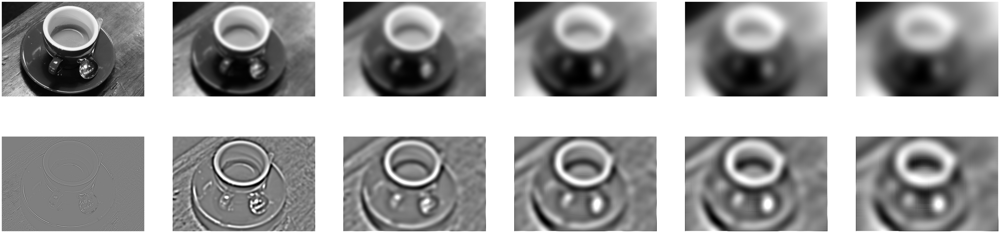

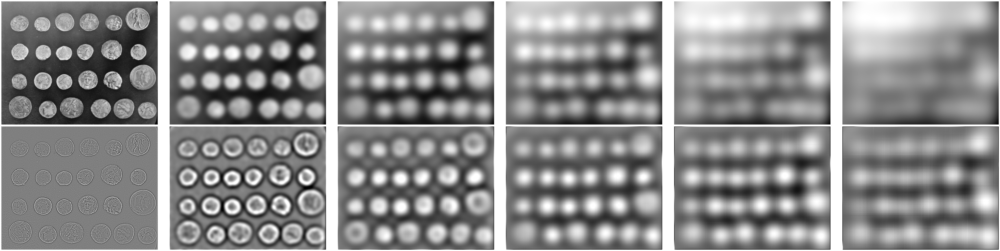

In [ ]:
# Implement scale space representation for the set of input images
for image_gray in images_gray:

    # TODO: Create Gaussian scale space of 6 levels for sigmas evenly space up to 25
    # You may use convolve2d
    sigmas = np.linspace(0.1, 25, 6)
    scale_space = []
    for sigma in sigmas:
      kernel = np.array(gaussian_kernel(sigma))
      image_gray_float = image_gray.astype(np.float64) / 255.0 # typecheck

      # determine padding amount based on kernel size
      ksize = kernel.shape[0]
      pad_amount = (ksize - 1) // 2

      # pad the image using edge padding
      padded_image = np.pad(image_gray_float, pad_width=pad_amount, mode='edge')g.
      convolved_image = convolve2d(padded_image, kernel, mode='valid', boundary='symm')

      scale_space.append(convolved_image)

    # TODO: Compute Laplacian with kernel size of 3 over the Gaussian scale space
    # You may use skimage.filters.laplace
    laplacian_scale_space = []
    for scale_image in scale_space:
      laplacian_scale_space.append(filters.laplace(scale_image, ksize=3))

    # TODO: Compute normalized Laplacian of Gaussians
    normalized_laplacian = []
    for i, l in enumerate(laplacian_scale_space):
      sig = sigmas[i]
      normalized_laplacian.append(l * sig ** 2)

    # TODO: 2 by 6 figure with (72, 18) figure size and plot each gray image with 'gray' colormap
    # Show scale space image in row 1 and normalized Laplacian of Gaussians in row 2
    fig, axes = plt.subplots(2, 6, figsize=(72, 18))
    for i in range(6):
      # scale space image
      ax = axes[0, i]
      ax.imshow(scale_space[i], cmap='gray')
      ax.axis('off')

      # NLOG
      ax = axes[1, i]
      m = np.percentile(np.abs(normalized_laplacian[i]), 99) or 1e-6
      ax.imshow(normalized_laplacian[i], cmap='gray', vmin=-m, vmax=+m) # try changing vmin/vmax
      ax.axis('off')

plt.tight_layout()
plt.show()

Blob detector

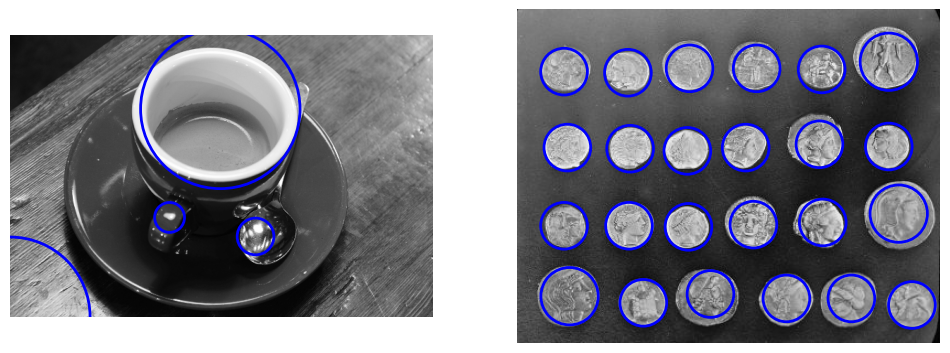

In [ ]:
# TODO: Use skimage.feature.blob_log to detect blobs in original gray images
# using a minimum sigma of 15 and a maximum sigma of 80 and 20 sigmas total
# thresholding is performed at 0.15
# Note: skimage.feature.blob_log returns the coordinates (x, y) and scale (sigma) of the blob
fig, plts = plt.subplots(1, 2, figsize=(12, 24))
for idx, image_gray in enumerate(images_gray):
  blobs_gray = feature.blob_log(image_gray, min_sigma=15, max_sigma=80, num_sigma=20, threshold=0.15)

  # TODO: Create a 1 x 2 figure of (12, 24) and plot blobs as blue circles with linewidth=2, and fill=False
  ax = plts[idx] # Get the current axes object for clarity
  ax.imshow(images_gray[idx], cmap='gray') # Display the image first
  ax.axis('off') # Turn off axes
  for row, col, sigma in blobs_gray:
    blob_radii = sigma * np.sqrt(2)
    circle = matplotlib.patches.Circle(
        (col, row),
        radius=blob_radii,
        color='blue',
        linewidth=2,
        fill=False
    )
    ax.add_patch(circle)

plt.show()

Multiscale representation with Gaussian pyramid

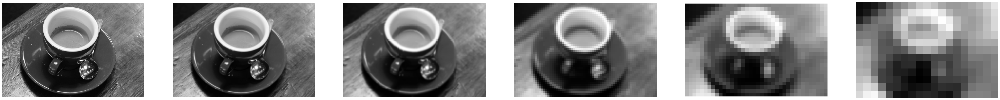

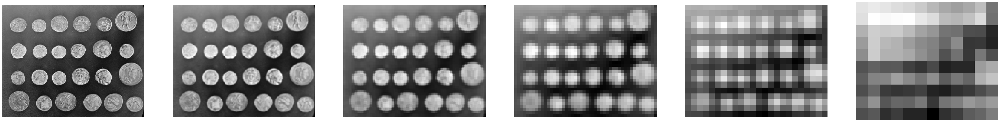

In [ ]:
gaussian_pyramids = []

# TODO: Create a 6 level Gaussian pyramid for each gray image using sigma of 1
# with subsampling factor of 2 and store each pyramid into gaussian_pyramids above to be used for the next code block
for image_gray in images_gray:
    pyramid = tuple(transform.pyramid_gaussian(image_gray, max_layer=5, downscale=2, sigma=1))
    gaussian_pyramids.append(pyramid)

    # Visualize Gaussian pyramid
    fig = plt.figure(figsize=(72, 18))

    for idx, gaussian_pyramid_image in enumerate(pyramid):
        ax = fig.add_subplot(1, 6, idx + 1)
        ax.imshow(gaussian_pyramid_image, cmap='gray')
        config_plot()


Laplacian pyramid

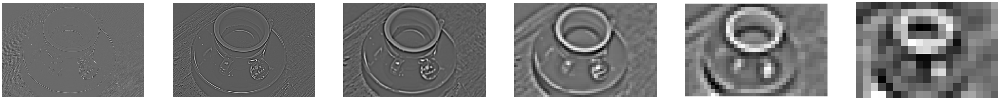

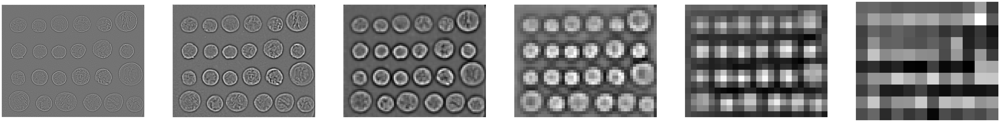

In [ ]:
laplacian_pyramids = []

# TODO: Create a 6 level Laplacian pyramid for each gray image using their Gaussian pyramids
# Store each pyramid into laplacian_pyramids above to be used for the next code block
for image_gray in images_gray:
    laplacian_pyramid = tuple(transform.pyramid_laplacian(image_gray, max_layer=5, downscale=2, sigma=1))
    laplacian_pyramids.append(laplacian_pyramid)

    # Visualize Gaussian pyramid
    fig = plt.figure(figsize=(72, 18))

    for idx, laplacian_pyramid_image in enumerate(laplacian_pyramid):
        ax = fig.add_subplot(1, 6, idx + 1)
        ax.imshow(laplacian_pyramid_image, cmap='gray')
        config_plot()


Image reconstruction with Laplacian Pyramid

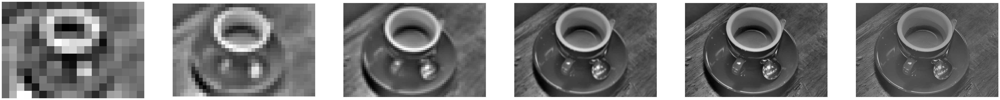

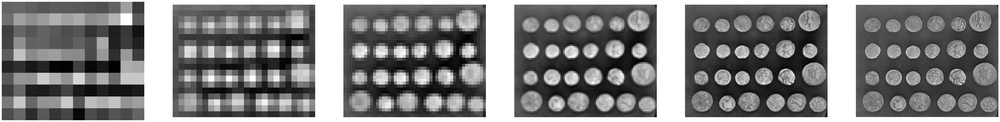

In [ ]:
# TODO: Reconstruct each "compressed" image in Laplacian pyramid
for laplacian_pyramid in laplacian_pyramids:

    # Initialize the image reconstruction pyramid
    # NOTE: coarest Gaussian level is the last element of the laplacian_pyramid by return
    current_reconstruction = laplacian_pyramid[-1]

    # store the images at each step of reconstruction
    image_reconstruction_steps = [current_reconstruction]

    '''
    Reconstruction process:
    Iterate from coarsest to finest
    1. Expand current level to size of next Laplacian lvl
    2. Add to the next level (adds back details for this scale)
    Result: new reconstructed image for the next level up
    '''
    # Reconstruction process
    for i in range(len(laplacian_pyramid) - 2, -1, -1): # start from 2nd last
      expanded = transform.pyramid_expand(current_reconstruction)
      laplacian_level = laplacian_pyramid[i] # current laplacian level

      # Get the dimensions of the Laplacian level
      rows, cols = laplacian_level.shape

      # Crop the expanded image to match the Laplacian level's dimensions
      expanded = expanded[:rows, :cols]

      current_reconstruction = expanded + laplacian_level
      image_reconstruction_steps.append(current_reconstruction)

    # Visualize reconstructed image pyramid
    fig = plt.figure(figsize=(72, 18))

    for idx, image in enumerate(image_reconstruction_steps):
        ax = fig.add_subplot(1, 6, idx + 1)
        ax.imshow(image, cmap='gray')
        config_plot()